In [1]:
import torch
from torch.utils.data import DataLoader, random_split, Subset
from torchvision import datasets, transforms, models
from torchvision.datasets import ImageFolder
from torchinfo import summary

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image


In [3]:
import os
from pathlib import Path
from tqdm.auto import tqdm
import random

c:\Users\Swopil\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
torch.__version__

'2.0.1+cpu'

In [5]:

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [6]:
seed = 42

In [7]:
def walk_through_dir(dir_path):
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

walk_through_dir("dataset")

There are 2 directories and 4 images in 'dataset'.
There are 0 directories and 755 images in 'dataset\fire_images'.
There are 0 directories and 244 images in 'dataset\non_fire_images'.


In [8]:
fire_dir = Path("dataset\\fire_images")
non_fire_dir = Path("dataset\\non_fire_images")

fire_dir, non_fire_dir

(WindowsPath('dataset/fire_images'), WindowsPath('dataset/non_fire_images'))

Random image path: dataset\fire_images\fire.689.png
Image class: fire_images
Image height: 360
Image width: 640


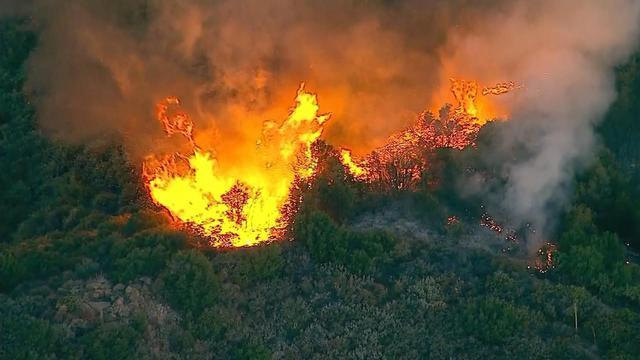

In [9]:
#setting seed
random.seed(seed)

#getting all image paths from the fire file (* means "any combination")
fire_image_list = list(fire_dir.glob("*.*.png"))

#getting random image path
random_fire_image_path = random.choice(fire_image_list)

#getting image class from path name
fire_image_class = random_fire_image_path.parent.stem

#open image
img = Image.open(random_fire_image_path)

print(f"Random image path: {random_fire_image_path}")
print(f"Image class: {fire_image_class}")
print(f"Image height: {img.height}") 
print(f"Image width: {img.width}")
img

Random image path: dataset\non_fire_images\non_fire.26.png
Image class: non_fire_images
Image height: 1271
Image width: 1920


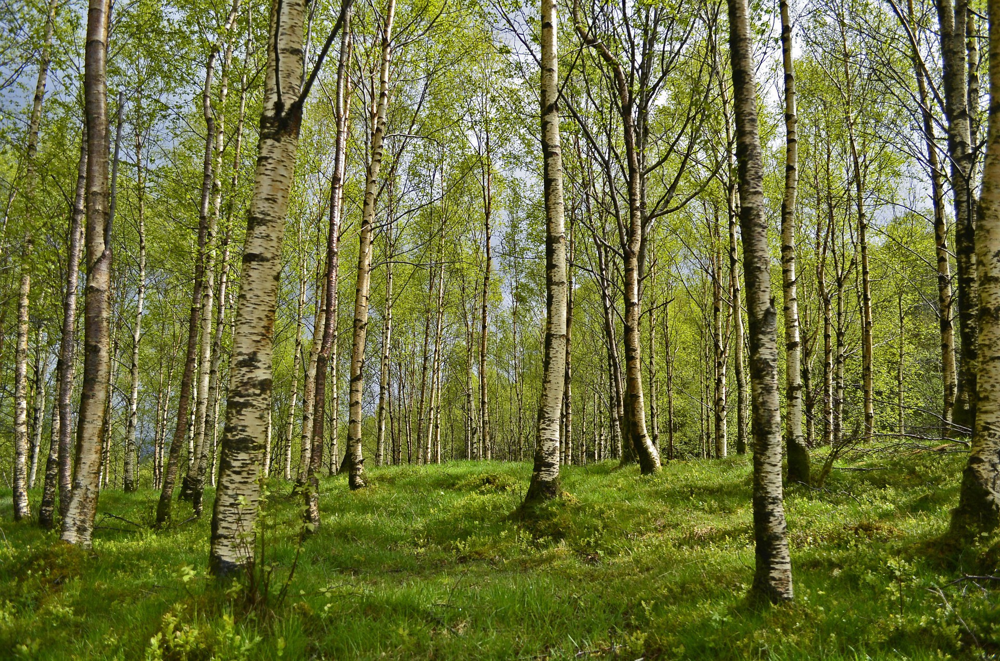

In [10]:
random.seed(seed)

#get all image paths from the non-fire file (* means "any combination")
non_fire_image_list = list(non_fire_dir.glob("*.*.png"))

random_non_fire_image_path = random.choice(non_fire_image_list)
non_fire_image_class = random_non_fire_image_path.parent.stem
img = Image.open(random_non_fire_image_path)

print(f"Random image path: {random_non_fire_image_path}")
print(f"Image class: {non_fire_image_class}")
print(f"Image height: {img.height}") 
print(f"Image width: {img.width}")
img

In [11]:
#Tranforming the Image using Compose of torchvision
data_transform = transforms.Compose([
    transforms.Resize(size=(128, 128)),             #Resizing the image to 128x128
    transforms.TrivialAugmentWide(num_magnitude_bins=31),       #TrivialAugmentWide is a transformation that randomly applies one of the following transformations to an image: AutoContrast, Brightness, Color, Contrast, Equalize, Invert, Posterize, Rotate, Sharpness, ShearX, ShearY, Solarize, TranslateX, TranslateY
    #turn the image into a torch.Tensor and also converts all pixel values from 0 to 255 to be between 0.0 and 1.0 
    transforms.ToTensor() 
])

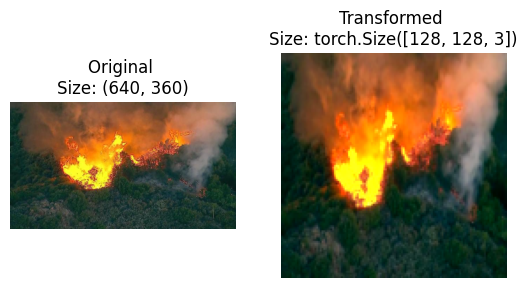

In [12]:
with Image.open(random_fire_image_path) as f:
    
    #before transformation
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(f) 
    ax[0].set_title(f"Original \nSize: {f.size}")
    ax[0].axis("off")
    
    #after transformation
    #PyTorch default is [C, H, W] but Matplotlib is [H, W, C]
    torch.manual_seed(seed)
    transformed_image = data_transform(f).permute(1, 2, 0) 
    ax[1].imshow(transformed_image) 
    ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
    ax[1].axis("off")

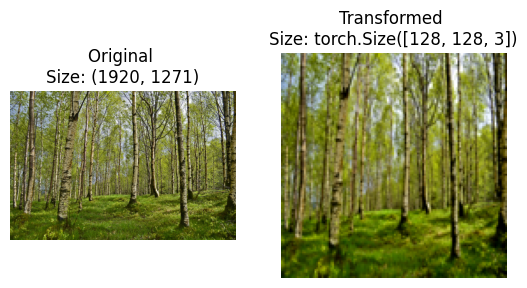

In [13]:
with Image.open(random_non_fire_image_path) as f:
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(f) 
    ax[0].set_title(f"Original \nSize: {f.size}")
    ax[0].axis("off")

    torch.manual_seed(seed)
    transformed_image = data_transform(f).permute(1, 2, 0) 
    ax[1].imshow(transformed_image) 
    ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
    ax[1].axis("off")

In [14]:
#define data root directory
root_dir = "dataset"

#you can also apply data transformation using the `transforms` parameter here
fire_dataset = ImageFolder(root_dir)

In [15]:
#the classes are the names of the files in the root folder
class_names = fire_dataset.classes
class_names

['fire_images', 'non_fire_images']

In [16]:
#class names as a dict
class_dict = fire_dataset.class_to_idx
class_dict

{'fire_images': 0, 'non_fire_images': 1}

In [17]:
#split the dataset into training, validation and testing
train_dataset, valid_dataset, test_dataset = random_split(fire_dataset, [0.7, 0.15, 0.15], generator=torch.Generator().manual_seed(seed))

In [18]:
len(train_dataset), len(valid_dataset), len(test_dataset)

(700, 150, 149)

In [19]:
class MySubset(torch.utils.data.Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
        
    def __getitem__(self, index):
        x, y = self.subset[index]
        
        #if a transform argument is provided, apply the transformaiton to the subset
        if self.transform:
            x = self.transform(x)
        return x, y
        
    def __len__(self):
        return len(self.subset)

In [20]:
#apply data transformation only to the training and validation dataset
train_dataset = MySubset(train_dataset, transform=data_transform)
valid_dataset = MySubset(valid_dataset, transform=data_transform)

In [21]:
#use DataLoader to load and group dataset into batches
batch_size = 32

torch.manual_seed(seed)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

torch.manual_seed(seed)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

In [22]:
#check that each batch contains 32 samples of images
img, label = next(iter(train_loader))

print(f"Image shape: {img.shape} -> [batch_size, color_channels, height, width]")
print(f"Label shape: {label.shape}")

Image shape: torch.Size([32, 3, 128, 128]) -> [batch_size, color_channels, height, width]
Label shape: torch.Size([32])


In [23]:
import torch.nn as nn


In [24]:
#define architecture for our baseline CNN model
class Baseline(nn.Module):

    def __init__(self, input_shape: int, hidden_units: int, output_shape: int) -> None:
        super().__init__()
        
        self.conv_block_1 = nn.Sequential(
            #first convolution layer
            nn.Conv2d(in_channels=input_shape, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            #second convolution layer
            nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            #pooling layer
            nn.MaxPool2d(kernel_size=3, stride=3)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            #we can find the number of layers checking the summary from torchinfo (example below)
            nn.Linear(in_features=17640,
                      out_features=output_shape)
        )
    
    def forward(self, x: torch.Tensor):
        
        return self.classifier(self.conv_block_1(x)) #leverage the benefits of operator fusion

In [25]:
torch.manual_seed(seed)
#instantiate baseline model
baseline = Baseline(input_shape=3,
                  hidden_units=10, 
                  output_shape=1).to(device)
baseline

Baseline(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=17640, out_features=1, bias=True)
  )
)

In [26]:
#see the outputs by feeding in a test pass
summary(baseline, input_size=[32, 3, 128, 128])

Layer (type:depth-idx)                   Output Shape              Param #
Baseline                                 [32, 1]                   --
├─Sequential: 1-1                        [32, 10, 42, 42]          --
│    └─Conv2d: 2-1                       [32, 10, 128, 128]        280
│    └─ReLU: 2-2                         [32, 10, 128, 128]        --
│    └─Conv2d: 2-3                       [32, 10, 128, 128]        910
│    └─ReLU: 2-4                         [32, 10, 128, 128]        --
│    └─MaxPool2d: 2-5                    [32, 10, 42, 42]          --
├─Sequential: 1-2                        [32, 1]                   --
│    └─Flatten: 2-6                      [32, 17640]               --
│    └─Linear: 2-7                       [32, 1]                   17,641
Total params: 18,831
Trainable params: 18,831
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 624.47
Input size (MB): 6.29
Forward/backward pass size (MB): 83.89
Params size (MB): 0.08
Estimated Total Size (M

In [27]:
#define function for training and evaluating each epoch
def train_per_epoch(model, train_dataloader, test_dataloader, loss_fn, optimizer):

    model.train() 
    train_loss, train_acc = 0, 0
    
    #loop through data loader data batches

    for batch, (X, y) in enumerate(train_dataloader):
        
        X, y = X.to(device), torch.unsqueeze(y, dim=1).float().to(device)
        
        #make prediction
        y_logits = model(X)
        y_pred = torch.round(torch.sigmoid(y_logits))
        
        #calculate and accumulate loss
        loss = loss_fn(y_logits, y)
        train_loss += loss.item()
        
        #calculate and accumulate accuracy
        acc = (y_pred == y).sum().item()/len(y)
        train_acc += acc
        
        #update parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    #Calculate the average loss and average acc by batch (in one epoch)
    train_loss = train_loss / len(train_dataloader)
    train_acc = train_acc / len(train_dataloader)

    ### Testing Loop
    model.eval() 
    test_loss, test_acc = 0, 0
    
    with torch.inference_mode():

        for batch, (X, y) in enumerate(test_dataloader):

            X, y = X.to(device), torch.unsqueeze(y, dim=1).float().to(device)

            test_logits = model(X)
            test_pred = torch.round(torch.sigmoid(test_logits))

            loss = loss_fn(test_logits, y)
            test_loss += loss.item()

            #calculate and accumulate accuracy
            acc = (test_pred == y).sum().item()/len(y)
            test_acc += acc
            
    #Calculate the average loss and average acc by batch (in one epoch)
    test_loss = test_loss / len(test_dataloader)
    test_acc = test_acc / len(test_dataloader)
    return train_loss, train_acc, test_loss, test_acc

In [28]:
#setup ModelCheckpoint
def checkpoint(model, filename):
    torch.save(model.state_dict(), filename)
    
def resume(model, filename):
    model.load_state_dict(torch.load(filename))

In [30]:
#define train function
def train(model, train_dataloader, test_dataloader, optimizer, loss_fn, epochs, best_model_path):
    
    results = {"train_loss": [], "train_acc": [], "test_loss": [], "test_acc": []}
    
    #setup early stopping and model checkpoint
    early_stop_threshold = 10
    best_loss = float("inf")
    best_epoch = -1
    
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc, test_loss, test_acc = train_per_epoch(model=model, train_dataloader=train_dataloader, test_dataloader=test_dataloader, loss_fn=loss_fn, optimizer=optimizer)
        
        print(f"Epoch: {epoch+1} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | test_loss: {test_loss:.4f} | test_acc: {test_acc:.4f}")

        #update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
        
        #EarlyStopping and ModelCheckpoint
        if test_loss < best_loss:
            best_loss = test_loss
            best_epoch = epoch
            checkpoint(model, best_model_path)
        elif epoch - best_epoch > early_stop_threshold:
            print("Early stopped training at epoch %d" % epoch+1)
            break  # terminate the training loop
    
    print(f"Epoch with best loss: Epoch {best_epoch+1} at {best_loss:.4f}")

    return results

In [31]:
#set random seeds
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

NUM_EPOCHS = 20

#loss function and optimizer
loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(params=baseline.parameters(), lr=0.001)

#train baseline model
baseline_results = train(model=baseline, train_dataloader=train_loader, test_dataloader=valid_loader, optimizer=optimizer, loss_fn=loss_fn, epochs=NUM_EPOCHS, best_model_path = "best_baseline_model.pth")

  5%|▌         | 1/20 [00:37<11:47, 37.26s/it]

Epoch: 1 | train_loss: 0.5356 | train_acc: 0.7539 | test_loss: 0.4049 | test_acc: 0.7761


 10%|█         | 2/20 [01:09<10:19, 34.43s/it]

Epoch: 2 | train_loss: 0.3678 | train_acc: 0.8346 | test_loss: 0.2508 | test_acc: 0.8943


 15%|█▌        | 3/20 [01:42<09:36, 33.89s/it]

Epoch: 3 | train_loss: 0.2528 | train_acc: 0.9002 | test_loss: 0.2131 | test_acc: 0.9347


 20%|██        | 4/20 [02:16<08:57, 33.59s/it]

Epoch: 4 | train_loss: 0.2040 | train_acc: 0.9127 | test_loss: 0.2401 | test_acc: 0.9159


 25%|██▌       | 5/20 [02:48<08:18, 33.21s/it]

Epoch: 5 | train_loss: 0.1864 | train_acc: 0.9200 | test_loss: 0.2070 | test_acc: 0.9159


 30%|███       | 6/20 [03:20<07:39, 32.84s/it]

Epoch: 6 | train_loss: 0.2088 | train_acc: 0.9109 | test_loss: 0.1867 | test_acc: 0.9347


 35%|███▌      | 7/20 [03:51<06:59, 32.28s/it]

Epoch: 7 | train_loss: 0.2004 | train_acc: 0.8955 | test_loss: 0.2093 | test_acc: 0.9500


 40%|████      | 8/20 [04:26<06:36, 33.07s/it]

Epoch: 8 | train_loss: 0.1773 | train_acc: 0.9188 | test_loss: 0.1857 | test_acc: 0.9159


 45%|████▌     | 9/20 [04:57<05:57, 32.48s/it]

Epoch: 9 | train_loss: 0.1683 | train_acc: 0.9373 | test_loss: 0.2141 | test_acc: 0.9034


 50%|█████     | 10/20 [05:27<05:15, 31.59s/it]

Epoch: 10 | train_loss: 0.1656 | train_acc: 0.9310 | test_loss: 0.2902 | test_acc: 0.9159


 55%|█████▌    | 11/20 [05:58<04:42, 31.34s/it]

Epoch: 11 | train_loss: 0.1782 | train_acc: 0.9160 | test_loss: 0.1825 | test_acc: 0.9284


 60%|██████    | 12/20 [06:38<04:33, 34.22s/it]

Epoch: 12 | train_loss: 0.1574 | train_acc: 0.9442 | test_loss: 0.2003 | test_acc: 0.9409


 65%|██████▌   | 13/20 [07:20<04:15, 36.49s/it]

Epoch: 13 | train_loss: 0.1555 | train_acc: 0.9357 | test_loss: 0.2043 | test_acc: 0.9193


 70%|███████   | 14/20 [08:08<03:59, 39.86s/it]

Epoch: 14 | train_loss: 0.1660 | train_acc: 0.9290 | test_loss: 0.1815 | test_acc: 0.9563


 75%|███████▌  | 15/20 [08:48<03:20, 40.05s/it]

Epoch: 15 | train_loss: 0.1482 | train_acc: 0.9424 | test_loss: 0.2176 | test_acc: 0.9222


 80%|████████  | 16/20 [09:27<02:39, 39.76s/it]

Epoch: 16 | train_loss: 0.1390 | train_acc: 0.9414 | test_loss: 0.2414 | test_acc: 0.8909


 85%|████████▌ | 17/20 [10:06<01:58, 39.41s/it]

Epoch: 17 | train_loss: 0.1318 | train_acc: 0.9570 | test_loss: 0.2056 | test_acc: 0.9165


 90%|█████████ | 18/20 [10:41<01:16, 38.23s/it]

Epoch: 18 | train_loss: 0.1226 | train_acc: 0.9572 | test_loss: 0.2287 | test_acc: 0.9250


 95%|█████████▌| 19/20 [11:17<00:37, 37.37s/it]

Epoch: 19 | train_loss: 0.1298 | train_acc: 0.9598 | test_loss: 0.2504 | test_acc: 0.9313


100%|██████████| 20/20 [11:52<00:00, 35.61s/it]

Epoch: 20 | train_loss: 0.1270 | train_acc: 0.9529 | test_loss: 0.3183 | test_acc: 0.9097
Epoch with best loss: Epoch 14 at 0.1815


In [32]:
def plot_results(results):
    
    train_loss = results["train_loss"]
    train_acc = results["train_acc"]
    test_loss = results["test_loss"]
    test_acc = results["test_acc"]
    
    epochs = range(len(results['train_loss']))
    
    plt.figure(figsize=(10, 5))
    
    #plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='train_loss')
    plt.plot(epochs, test_loss, label='test_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    #plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc, label='train_accuracy')
    plt.plot(epochs, test_acc, label='test_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend();

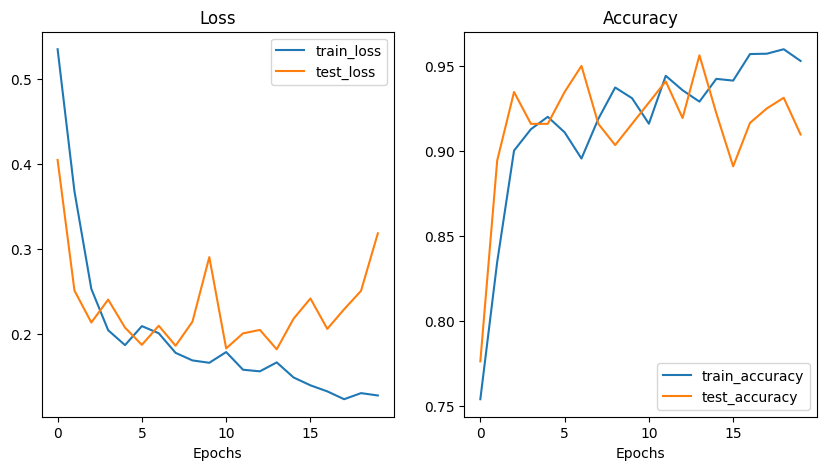

In [33]:
plot_results(baseline_results)

In [34]:
#define function to predict custom images
def pred_and_plot_image(model, image_path, transform, device: torch.device=device):
    
    img = Image.open(image_path)

    image_transform = transform

    model.to(device)
    model.eval()
    with torch.inference_mode():

        transformed_image = image_transform(img).unsqueeze(dim=0)
        target_image_pred = model(transformed_image.to(device))

        target_image_pred_probs = torch.sigmoid(target_image_pred)
        target_image_pred_label = torch.round(target_image_pred_probs)
        
    plt.figure()
    plt.imshow(img)
    plt.title(f"Pred: {target_image_pred_label.cpu().numpy()[0][0]} | Prob: {target_image_pred_probs.cpu().numpy()[0][0]: .3f}")
    plt.axis(False);

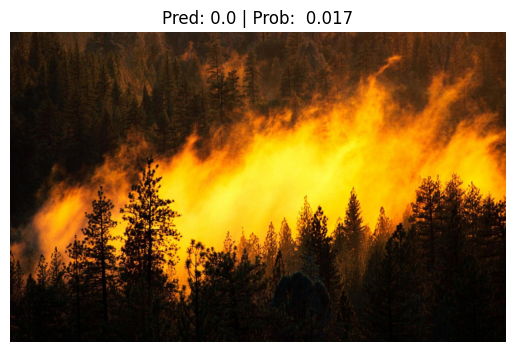

In [35]:
#predict fire image
pred_and_plot_image(baseline, "dataset//fire_image.jpg", data_transform, device)

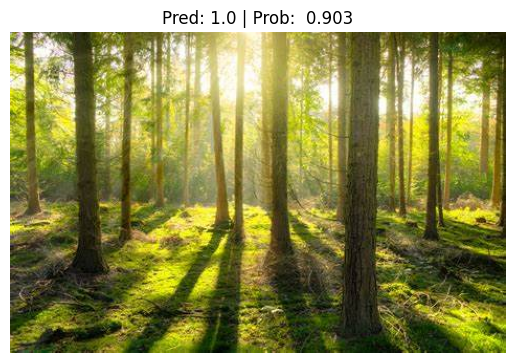

In [36]:
#predict fire image
pred_and_plot_image(baseline, "dataset//try1.jpg", data_transform, device)

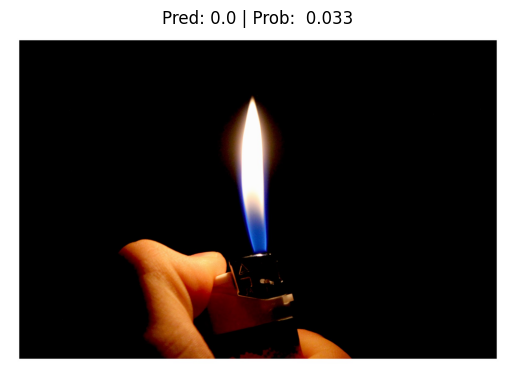

In [37]:
#predict fire image
pred_and_plot_image(baseline, "dataset//try2.jpg", data_transform, device)

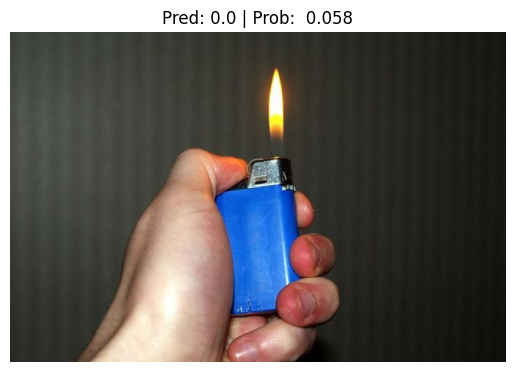

In [38]:
#predict fire image
pred_and_plot_image(baseline, "dataset//try3.jpg", data_transform, device)